# Output 2

### Position Plot

In [ ]:
import csv
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# Load data
positions_file = './frame_positions_orientations.csv'

In [ ]:
# Lists to store position data
frames = []
x_positions = []
y_positions = []
z_positions = []

In [ ]:
# Read the positions from the CSV file
with open(positions_file, 'r') as csvfile:
    reader = csv.reader(csvfile)
    next(reader)  # Skip header row
    for row in reader:
        frame, tx, ty, tz = row[0], float(row[1]), float(row[2]), float(row[3])
        frames.append(frame)
        x_positions.append(tx)
        y_positions.append(ty)
        z_positions.append(tz)


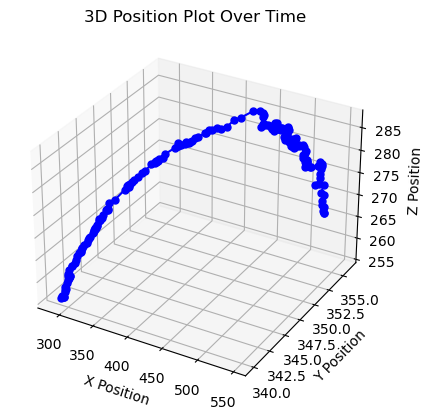

In [ ]:
# Plotting the 3D positions
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(x_positions, y_positions, z_positions, marker='o', color='b', linestyle='-', markersize=5)

# Labeling
ax.set_xlabel("X Position")
ax.set_ylabel("Y Position")
ax.set_zlabel("Z Position")
ax.set_title("3D Position Plot Over Time")

# Show plot
plt.show()

In [ ]:
import numpy as np
from matplotlib.animation import FuncAnimation
from PIL import Image

In [ ]:
output_gif = './position_animation.gif'

Text(0.5, 0.92, '3D Position Over Time')

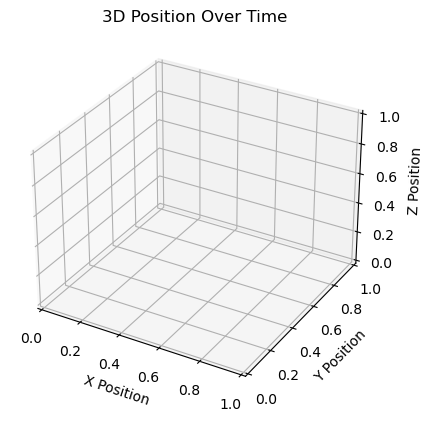

In [ ]:
# Set up the figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel("X Position")
ax.set_ylabel("Y Position")
ax.set_zlabel("Z Position")
ax.set_title("3D Position Over Time")

In [ ]:
# Function to update the plot for each frame
def update(frame):
    ax.clear()  # Clear previous frame's plot
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.set_zlabel("Z Position")
    ax.set_title("3D Position Over Time")
    
    # Plot positions up to the current frame
    ax.plot(x_positions[:frame + 1], y_positions[:frame + 1], z_positions[:frame + 1], 
            color='b', marker='o', markersize=5, linestyle='-')
    
    # Trace a thin line
    ax.plot(x_positions[:frame + 1], y_positions[:frame + 1], z_positions[:frame + 1], 
            color='lightblue', linewidth=0.5)
    
    # Display frame number
    ax.text2D(0.05, 0.95, f"Frame {frame}", transform=ax.transAxes, color="black", fontsize=12)

In [ ]:
# Create the animation
num_frames = len(x_positions)
ani = FuncAnimation(fig, update, frames=num_frames, interval=100)

# Save as GIF
ani.save(output_gif, writer='pillow', fps=10)
print(f"Animated GIF saved as {output_gif}")


Animated GIF saved as ./position_animation.gif


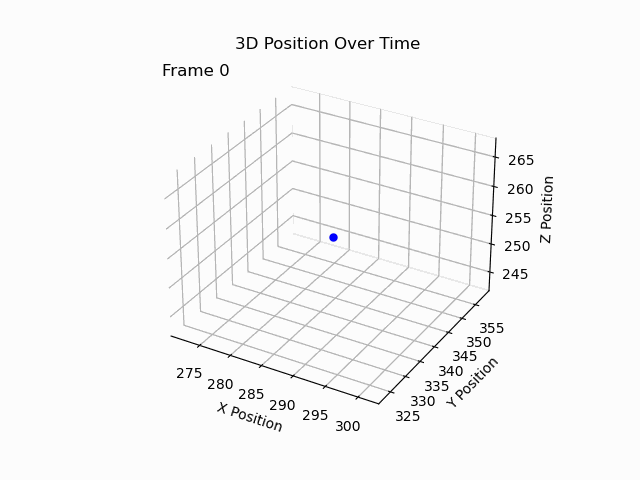

### Orientation Plot

In [ ]:
import csv
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from PIL import Image

In [ ]:
# Input file path
orientations_file = './frame_positions_orientations.csv'
output_gif = './orientation_animation.gif'

In [ ]:
# Lists to store orientation data
yaw_angles, pitch_angles, roll_angles = [], [], []

In [ ]:
# Read the orientations from the CSV file
with open(orientations_file, 'r') as csvfile:
    reader = csv.reader(csvfile)
    next(reader)  # Skip header row
    for row in reader:
        yaw_angles.append(float(row[4]))
        pitch_angles.append(float(row[5]))
        roll_angles.append(float(row[6]))

Text(0.5, 0.92, 'Orientation Over Time')

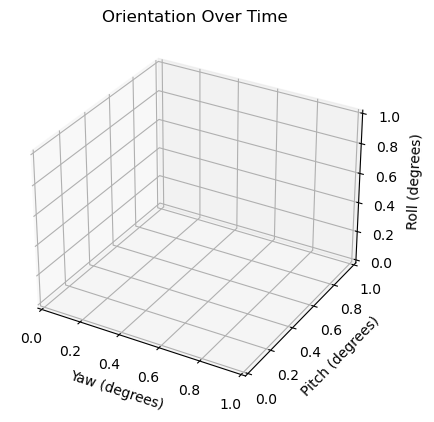

In [ ]:
# Set up the figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel("Yaw (degrees)")
ax.set_ylabel("Pitch (degrees)")
ax.set_zlabel("Roll (degrees)")
ax.set_title("Orientation Over Time")

In [ ]:
# Function to update the plot for each frame
def update(frame):
    ax.clear()  # Clear previous frame's plot
    ax.set_xlabel("Yaw (degrees)")
    ax.set_ylabel("Pitch (degrees)")
    ax.set_zlabel("Roll (degrees)")
    ax.set_title("Orientation Over Time")
    
    # Plot orientations up to the current frame
    ax.plot(yaw_angles[:frame + 1], pitch_angles[:frame + 1], roll_angles[:frame + 1], 
            color='orange', marker='o', markersize=5, linestyle='-')
    
    # Trace a thin line for orientation path
    ax.plot(yaw_angles[:frame + 1], pitch_angles[:frame + 1], roll_angles[:frame + 1], 
            color='lightcoral', linewidth=0.5)
    
    # Display frame number
    ax.text2D(0.05, 0.95, f"Frame {frame}", transform=ax.transAxes, color="black", fontsize=12)

In [ ]:
# Create the animation
num_frames = len(yaw_angles)
ani = FuncAnimation(fig, update, frames=num_frames, interval=100)

# Save as GIF
ani.save(output_gif, writer='pillow', fps=10)
print(f"Orientation animation saved as {output_gif}")

Orientation animation saved as ./orientation_animation.gif


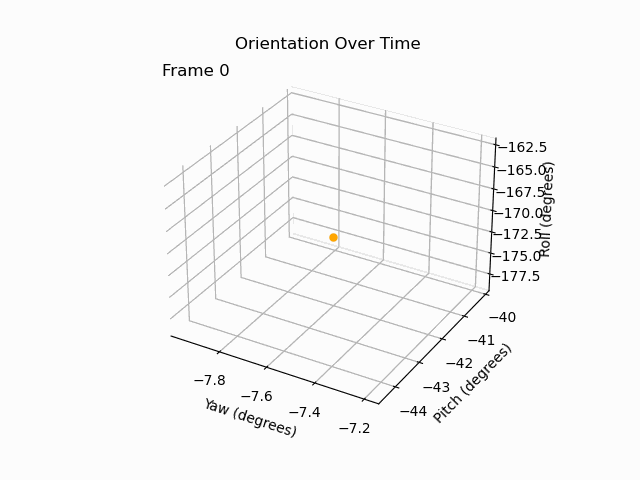

### Orientation Vector Visualization

In [ ]:
output_gif = './orientation_vectors_animation.gif'

In [ ]:
# Lists to store rotation matrices
rotation_matrices = []

# Read the rotation part (Euler angles) and construct rotation matrices
with open(orientations_file, 'r') as csvfile:
    reader = csv.reader(csvfile)
    next(reader)  # Skip header row
    for row in reader:
        # Extract Euler angles and convert to radians
        yaw = np.radians(float(row[4]))
        pitch = np.radians(float(row[5]))
        roll = np.radians(float(row[6]))
        
        # Compute the rotation matrix from Euler angles (ZYX order)
        cy, sy = np.cos(yaw), np.sin(yaw)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)
        
        # Rotation matrix using ZYX Euler angles
        rotation_matrix = np.array([
            [cy * cp, cy * sp * sr - sy * cr, cy * sp * cr + sy * sr],
            [sy * cp, sy * sp * sr + cy * cr, sy * sp * cr - cy * sr],
            [-sp,     cp * sr,               cp * cr]
        ])
        
        rotation_matrices.append(rotation_matrix)

Text(0.5, 0.92, 'Device Orientation in Global Frame')

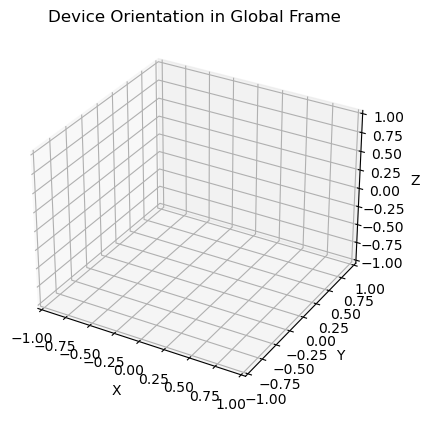

In [ ]:
# Define unit vectors for the device's local axes in its own frame
x_unit, y_unit, z_unit = np.array([1, 0, 0]), np.array([0, 1, 0]), np.array([0, 0, 1])

# Set up the figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
ax.set_zlim([-1, 1])
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("Device Orientation in Global Frame")

In [ ]:
# Function to update the plot for each frame
def update(frame):
    ax.clear()  # Clear previous frame's plot
    ax.set_xlim([-1, 1])
    ax.set_ylim([-1, 1])
    ax.set_zlim([-1, 1])
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Device Orientation in Global Frame")
    
    # Apply the rotation matrix to each unit vector
    rotated_x = rotation_matrices[frame].dot(x_unit)
    rotated_y = rotation_matrices[frame].dot(y_unit)
    rotated_z = rotation_matrices[frame].dot(z_unit)
    
    # Plot the rotated vectors
    ax.quiver(0, 0, 0, rotated_x[0], rotated_x[1], rotated_x[2], color='r', label="X-axis")
    ax.quiver(0, 0, 0, rotated_y[0], rotated_y[1], rotated_y[2], color='g', label="Y-axis")
    ax.quiver(0, 0, 0, rotated_z[0], rotated_z[1], rotated_z[2], color='b', label="Z-axis")
    
    # Display frame number
    ax.text2D(0.05, 0.95, f"Frame {frame}", transform=ax.transAxes, color="black", fontsize=12)

In [ ]:
# Create the animation
num_frames = len(rotation_matrices)
ani = FuncAnimation(fig, update, frames=num_frames, interval=100)

# Save as GIF
ani.save(output_gif, writer='pillow', fps=10)
print(f"Orientation vectors animation saved as {output_gif}")


Orientation vectors animation saved as ./orientation_vectors_animation.gif


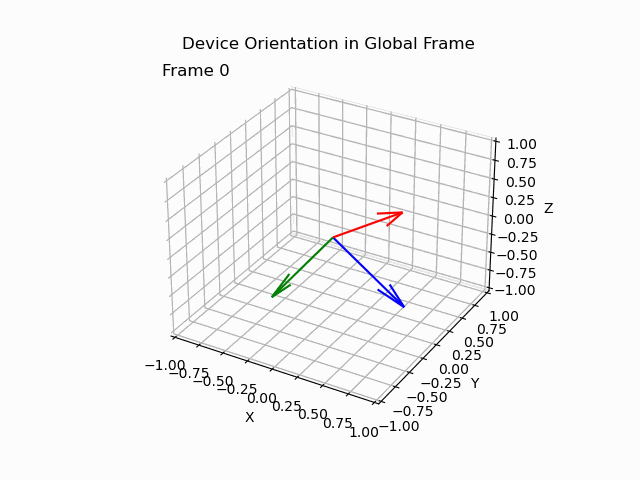